# Computer Vision 101: Working with Color Images in Python

## Setup

In [1]:
import numpy as np

from skimage.color import rgb2lab, rgb2gray, lab2rgb
from skimage.io import imread, imshow

import matplotlib.pyplot as plt

In [2]:
%matplotlib inline 
%config InlineBackend.figure_format = 'retina'

In [3]:
def print_image_summary(image, labels):
    '''
    Function for printing out a summary of the image:
    * its size,
    * the range of values in the channels.
    
    Parameters
    ----------
    image : numpy.ndarray
        The image to analyze, can be 2D or 3D (multiple channels)
    labels : list of strings
        The list containing the expected channels
    '''
    print('--------------')
    print('Image Details:')
    print('--------------')
    print(f'Image dimensions: {image.shape}')
    print('Channels:')
    
    if len(labels) == 1:
        image = image[..., np.newaxis]
        
    for i, lab in enumerate(labels):
        min_val = np.min(image[:,:,i])
        max_val = np.max(image[:,:,i])
        print(f'{lab} : min={min_val:.4f}, max={max_val:.4f}')

## Grayscale

In [4]:
image_gs = imread('crayons.jpg', as_gray=True)

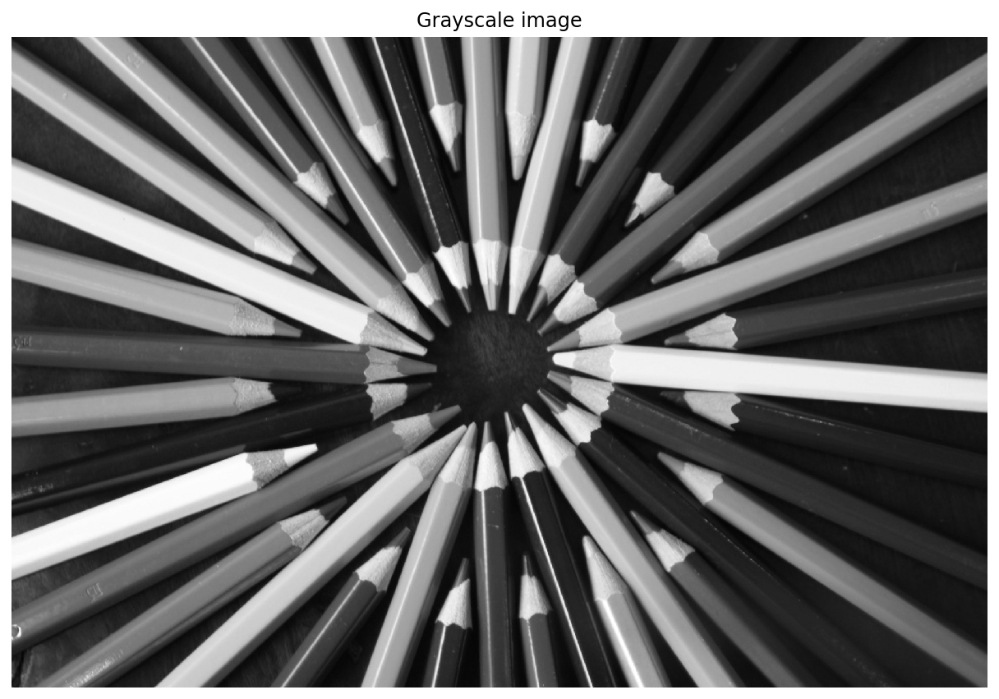

In [5]:
fig, ax = plt.subplots(figsize=(9, 16))
imshow(image_gs, ax=ax)
ax.set_title('Grayscale image')
ax.axis('off');

In [6]:
print_image_summary(image_gs, ['G'])

--------------
Image Details:
--------------
Image dimensions: (1280, 1920)
Channels:
G : min=0.0123, max=1.0000


## RGB

In [7]:
image_rgb = imread('crayons.jpg')

In [8]:
print_image_summary(image_rgb, ['R', 'G', 'B'])

--------------
Image Details:
--------------
Image dimensions: (1280, 1920, 3)
Channels:
R : min=0.0000, max=255.0000
G : min=0.0000, max=255.0000
B : min=0.0000, max=255.0000


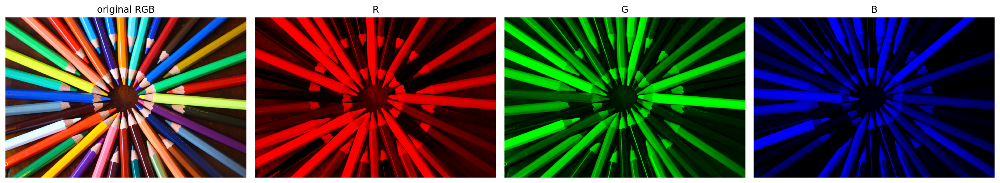

In [9]:
fig, ax = plt.subplots(1, 4, figsize = (18, 30))

ax[0].imshow(image_rgb/255.0) 
ax[0].axis('off')
ax[0].set_title('original RGB')

for i, lab in enumerate(['R','G','B'], 1):
    temp = np.zeros(image_rgb.shape)
    temp[:,:,i - 1] = image_rgb[:,:,i - 1]
    ax[i].imshow(temp/255.0) 
    ax[i].axis("off")
    ax[i].set_title(lab)

plt.tight_layout()
plt.savefig('rgb_1.png', dpi=300)
plt.show()

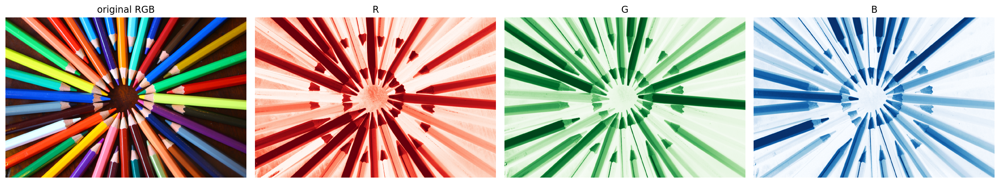

In [10]:
fig, ax = plt.subplots(1, 4, figsize = (18, 30))

ax[0].imshow(image_rgb) 
ax[0].axis('off')
ax[0].set_title('original RGB')

for i, cmap in enumerate(['Reds','Greens','Blues']):
    ax[i+1].imshow(image_rgb[:,:,i], cmap=cmap) 
    ax[i+1].axis('off')
    ax[i+1].set_title(cmap[0])
    
plt.tight_layout()
plt.savefig('rgb_2.png', dpi=300)

plt.show()

## Lab

In [11]:
image_lab = rgb2lab(image_rgb / 255)
print_image_summary(image_lab, ['L', 'a', 'b'])

--------------
Image Details:
--------------
Image dimensions: (1280, 1920, 3)
Channels:
L : min=0.8618, max=100.0000
a : min=-73.6517, max=82.9795
b : min=-94.7288, max=91.2710


**1st attempt**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)
/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


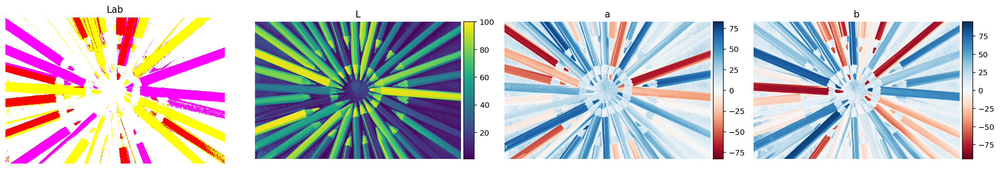

In [12]:
fig, ax = plt.subplots(1, 4, figsize = (18, 30))

ax[0].imshow(image_lab) 
ax[0].axis('off')
ax[0].set_title('Lab')

for i, col in enumerate(['L', 'a', 'b'], 1):
    imshow(image_lab[:, :, i-1], ax=ax[i])
    ax[i].axis('off')
    ax[i].set_title(col)

plt.tight_layout()
plt.savefig('lab_1.png', dpi=300)
fig.show()

**2nd attempt**

/Users/eryklewinson/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


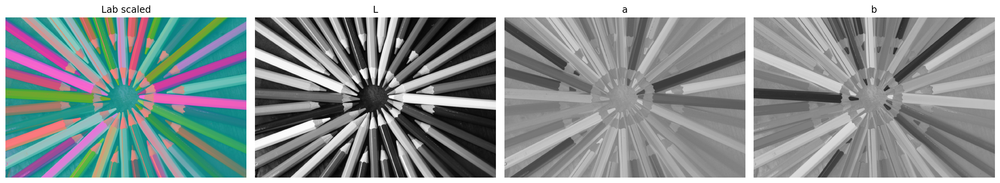

In [13]:
#scale the lab image
image_lab_scaled = (image_lab + [0, 128, 128]) / [100, 255, 255]

fig, ax = plt.subplots(1, 4, figsize = (18, 30))

ax[0].imshow(image_lab_scaled) 
ax[0].axis('off')
ax[0].set_title('Lab scaled')

for i, col in enumerate(['L', 'a', 'b'], 1):
    imshow(image_lab_scaled[:, :, i-1], ax=ax[i])
    ax[i].axis('off')
    ax[i].set_title(col)
    
plt.tight_layout()
plt.savefig('lab_2.png', dpi=300)
fig.show()

**3rd attempt**

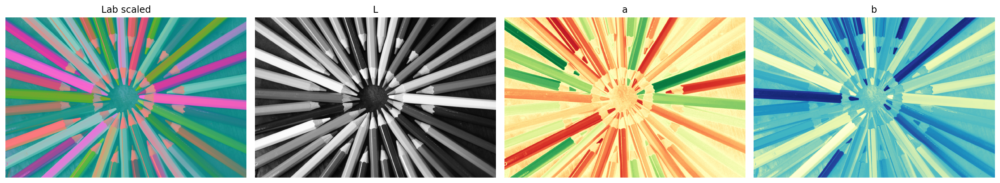

In [14]:
fig, ax = plt.subplots(1, 4, figsize = (18, 30))

ax[0].imshow(image_lab_scaled) 
ax[0].axis('off')
ax[0].set_title('Lab scaled')

imshow(image_lab_scaled[:,:,0], ax=ax[1]) 
ax[1].axis('off')
ax[1].set_title('L')

ax[2].imshow(image_lab_scaled[:,:,1], cmap='RdYlGn_r') 
ax[2].axis('off')
ax[2].set_title('a')

ax[3].imshow(image_lab_scaled[:,:,2], cmap='YlGnBu_r') 
ax[3].axis('off')
ax[3].set_title('b')
    
plt.tight_layout()
plt.savefig('lab_3.png', dpi=300)

plt.show()